In [1]:
import pandas as pd
from sklearn.manifold import MDS
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import numpy as np
from sklearn.metrics import silhouette_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut, cross_val_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.patches import Patch
from thesisv3.utils.helpers import concatenate_segments
from matplotlib.patches import Patch
from io import StringIO

In [2]:
# Import the classes
from thesisv3.classism import GraphBatcher
from thesisv3.validation.tuners import compare_kernels
from thesisv3.analysis.visualization import analyze_similarity
from thesisv3.validation.comparison import compare_within_and_between_pieces


pygame 2.6.1 (SDL 2.28.4, Python 3.12.3)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [ ]:
# topological = GraphBatcher(output_dir="./conference-output/topological_v1", k=8, force_connectivity=True, label='x')
# ir_mode = GraphBatcher(output_dir="./conference-output/ir_mode_v1", k=8, force_connectivity=True, label='ir_mode')
# expectancy = GraphBatcher(output_dir="./conference-output/expectancy_v1", k=8, force_connectivity=True, label='expectancy')

# top_df = compare_within_and_between_pieces(
#     pieces_dist_mat=topological.distmat_dict,
#     pieces_graph_dict=topological.graph_dict,
#     kernel_cls=kernel_class,
#     kernel_kwargs=kernel_kwargs,
#     minimum_segments=11
# )
# ir_mode_df = compare_within_and_between_pieces(
#     pieces_dist_mat=ir_mode.distmat_dict,
#     pieces_graph_dict=ir_mode.graph_dict,
#     kernel_cls=kernel_class,
#     kernel_kwargs=kernel_kwargs,
#     minimum_segments=11
# )
# exp_df = compare_within_and_between_pieces(
#     pieces_dist_mat=expectancy.distmat_dict,
#     pieces_graph_dict=expectancy.graph_dict,
#     kernel_cls=kernel_class,
#     kernel_kwargs=kernel_kwargs,
#     minimum_segments=11
# )
# top_df.describe()
# exp_df.describe()
# ir_mode_df.describe()

In [3]:
from grakel import WeisfeilerLehman

kernel_class = WeisfeilerLehman
kernel_kwargs = {'n_iter': 4, 'normalize': True}

In [4]:
expectancy_ir = GraphBatcher(output_dir="./conference-output/expectancy_ir_v1", k=8, force_connectivity=True, label='expectancy|ir_mode')

Loaded previous progress: 39 files already processed


In [5]:
exp_ir_df = compare_within_and_between_pieces(
    pieces_dist_mat=expectancy_ir.distmat_dict,
    pieces_graph_dict=expectancy_ir.graph_dict,
    kernel_cls=kernel_class,
    kernel_kwargs=kernel_kwargs,
    minimum_segments=11
)

Within-piece:   0%|          | 0/38 [00:00<?, ?it/s]

In [6]:
exp_ir_df.describe()

,Between_Similarity
count,1444.000000
mean,0.461526
std,0.240300
min,0.000000
25%,0.270914
50%,0.493634
75%,0.649382
max,0.930165


In [7]:
excluded_pieces = [
            'Mozart | Minuet in G Major',
            'Mozart | Piano Sonata No. 10 in C Major, K. 330 (1st movement)',
            "Mozart | Piano Sonata No. 11 in A Major, K. 331 'Rondo Alla Turca'",
            'Satie | Gnossienne No. 1',
            'Satie | Gnossienne No. 2',
            'Satie | Gnossienne No. 3',
            'Satie | Gnossienne No. 4'
        ]

In [8]:
# Filter the DataFrame to exclude rows that contain any of the excluded pieces
exp_ir_df_filtered = exp_ir_df[~exp_ir_df.apply(lambda row: any(piece in row.values for piece in excluded_pieces), axis=1)]

In [9]:
exp_ir_df_filtered

,Piece_1,Piece_2,Between_Similarity
0,Bach | Cello Suite No. 1 in G Major,Bach | Cello Suite No. 1 in G Major,0.856780
1,Bach | Cello Suite No. 2 in D Minor,Bach | Cello Suite No. 2 in D Minor,0.847434
2,Bach | Cello Suite No. 3 in C Major,Bach | Cello Suite No. 3 in C Major,0.863470
3,Bach | Cello Suite No. 4 in E-flat Major,Bach | Cello Suite No. 4 in E-flat Major,0.906397
4,Bach | Cello Suite No. 5 in C Minor,Bach | Cello Suite No. 5 in C Minor,0.659511
...,...,...,...
1439,Ysaÿe | Violin Sonata No. 6 in E Major,Ysaÿe | Violin Sonata No. 1 in G Minor,0.817130
1440,Ysaÿe | Violin Sonata No. 6 in E Major,Ysaÿe | Violin Sonata No. 2 in A Minor,0.835819
1441,Ysaÿe | Violin Sonata No. 6 in E Major,Ysaÿe | Violin Sonata No. 3 in D Minor,0.782207
1442,Ysaÿe | Violin Sonata No. 6 in E Major,Ysaÿe | Violin Sonata No. 4 in E Minor,0.825465


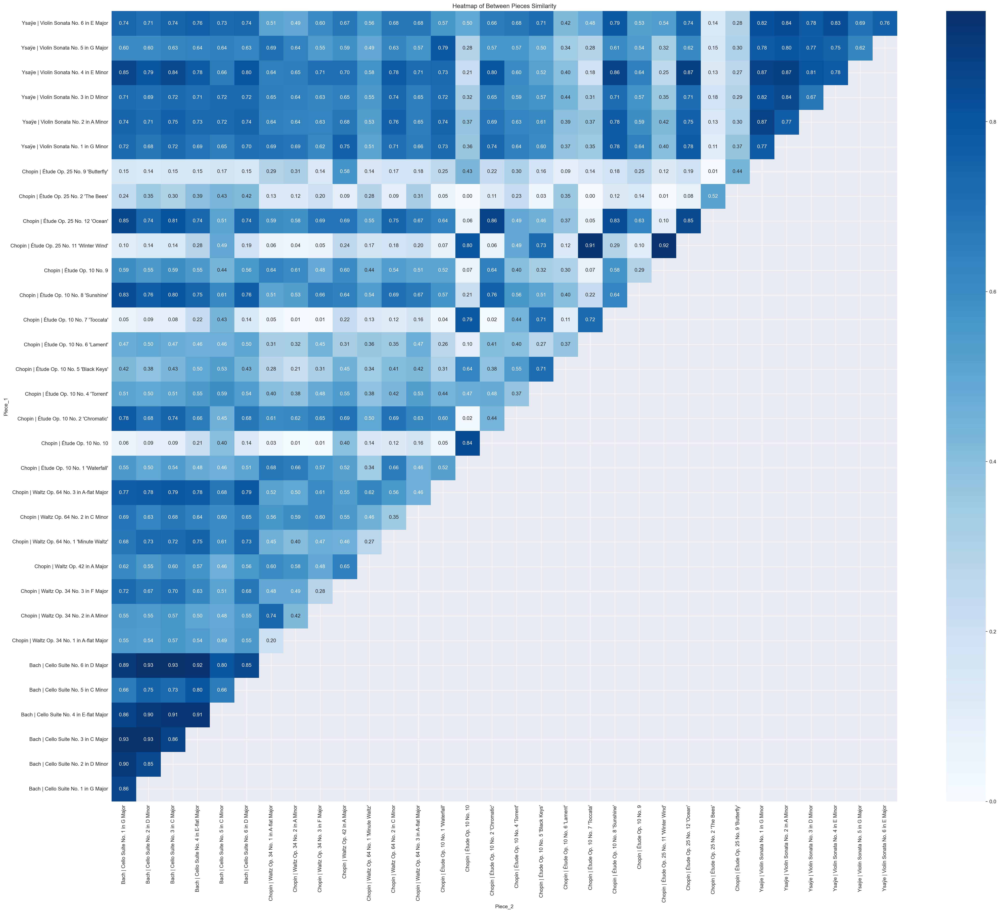

Median Similarity: 0.5474

Top 10 Highest Similarities:
1. Bach | Cello Suite No. 3 in C Major - Bach | Cello Suite No. 6 in D Major: 0.9302
2. Bach | Cello Suite No. 1 in G Major - Bach | Cello Suite No. 3 in C Major: 0.9292
3. Bach | Cello Suite No. 2 in D Minor - Bach | Cello Suite No. 3 in C Major: 0.9282
4. Bach | Cello Suite No. 2 in D Minor - Bach | Cello Suite No. 6 in D Major: 0.9269
5. Bach | Cello Suite No. 4 in E-flat Major - Bach | Cello Suite No. 6 in D Major: 0.9171
6. Chopin | Étude Op. 10 No. 7 'Toccata' - Chopin | Étude Op. 25 No. 11 'Winter Wind': 0.9126
7. Bach | Cello Suite No. 3 in C Major - Bach | Cello Suite No. 4 in E-flat Major: 0.9063
8. Bach | Cello Suite No. 1 in G Major - Bach | Cello Suite No. 2 in D Minor: 0.8971
9. Bach | Cello Suite No. 2 in D Minor - Bach | Cello Suite No. 4 in E-flat Major: 0.8968
10. Bach | Cello Suite No. 1 in G Major - Bach | Cello Suite No. 6 in D Major: 0.8913

Bottom 10 Lowest Similarities:
1. Chopin | Étude Op. 10 No. 7 'Tocca

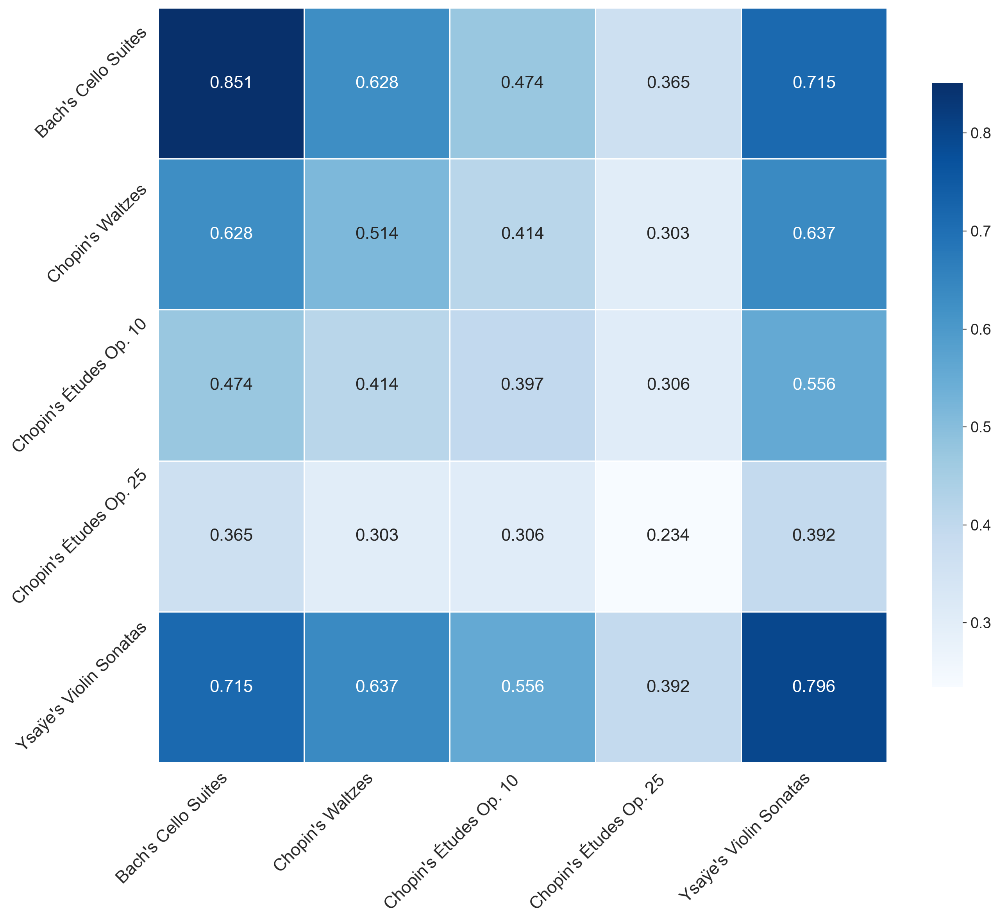

Average Similarity Matrix:
                        Bach's Cello Suites  Chopin's Waltzes  \
Bach's Cello Suites                   0.851             0.628   
Chopin's Waltzes                      0.628             0.514   
Chopin's Études Op. 10                0.474             0.414   
Chopin's Études Op. 25                0.365             0.303   
Ysaÿe's Violin Sonatas                0.715             0.637   

                        Chopin's Études Op. 10  Chopin's Études Op. 25  \
Bach's Cello Suites                      0.474                   0.365   
Chopin's Waltzes                         0.414                   0.303   
Chopin's Études Op. 10                   0.397                   0.306   
Chopin's Études Op. 25                   0.306                   0.234   
Ysaÿe's Violin Sonatas                   0.556                   0.392   

                        Ysaÿe's Violin Sonatas  
Bach's Cello Suites                      0.715  
Chopin's Waltzes                       

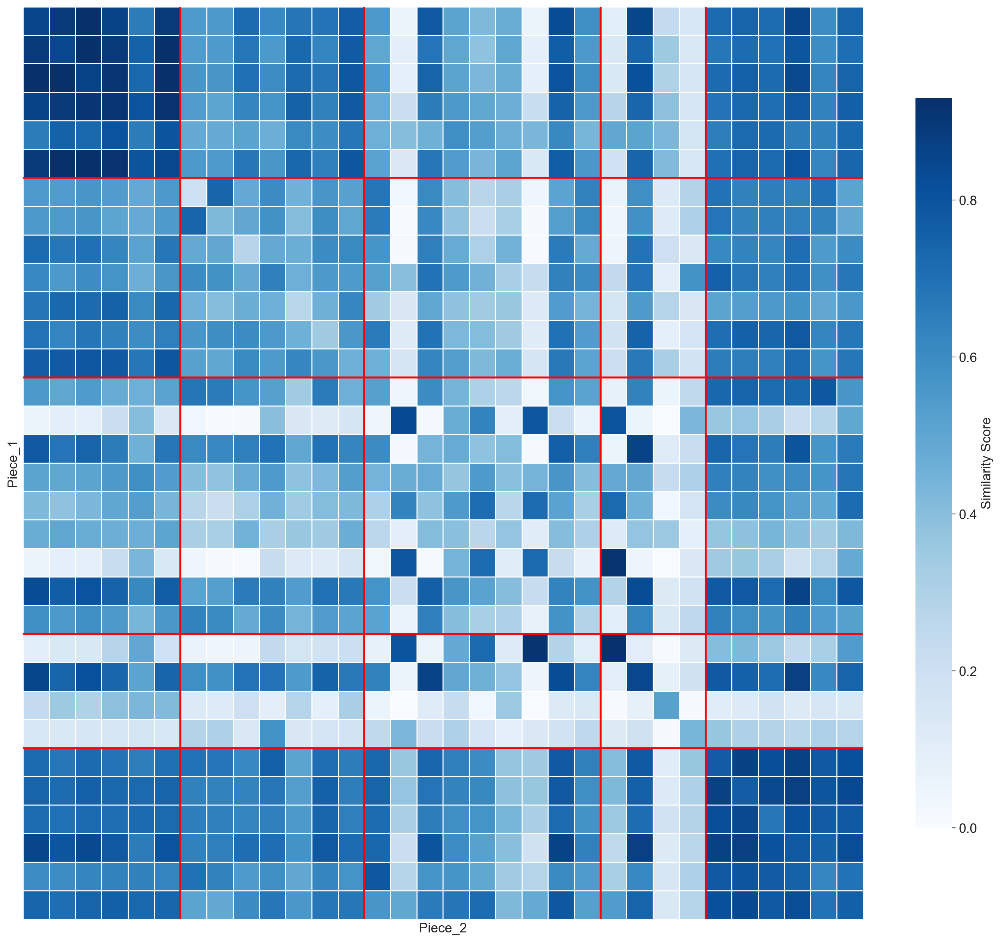

In [10]:
similarity_data = analyze_similarity(exp_ir_df_filtered, excluded_pieces=excluded_pieces)

In [ ]:
similarity_data.keys()

In [ ]:
similarity_data['similarity_matrix']

In [ ]:
similarity_data['statistics']['top_similarities']

In [ ]:
similarity_data['statistics']['bottom_similarities']

In [ ]:
similarity_data['statistics']['median_similarities']

In [ ]:
similarity_data['piece_type_avg']

In [ ]:
from thesisv3.utils.helpers import load_from_pickle

  0%|          | 0/5 [00:00<?, ?it/s]

Processing k values:   0%|          | 0/8 [00:00<?, ?it/s]

Processing k values:   0%|          | 0/8 [00:00<?, ?it/s]

Processing k values:   0%|          | 0/8 [00:00<?, ?it/s]

Processing k values:   0%|          | 0/8 [00:00<?, ?it/s]

Processing k values:   0%|          | 0/8 [00:00<?, ?it/s]

C:\.School\Thesisv3\thesisv3\validation\tuners.py:506: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\.School\Thesisv3\thesisv3\validation\tuners.py:507: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(os.path.join(output_dir, 'summary', 'kernel_comparison_raw_vs_adj.png'))
C:\.School\Thesisv3\thesisv3\validation\tuners.py:511: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


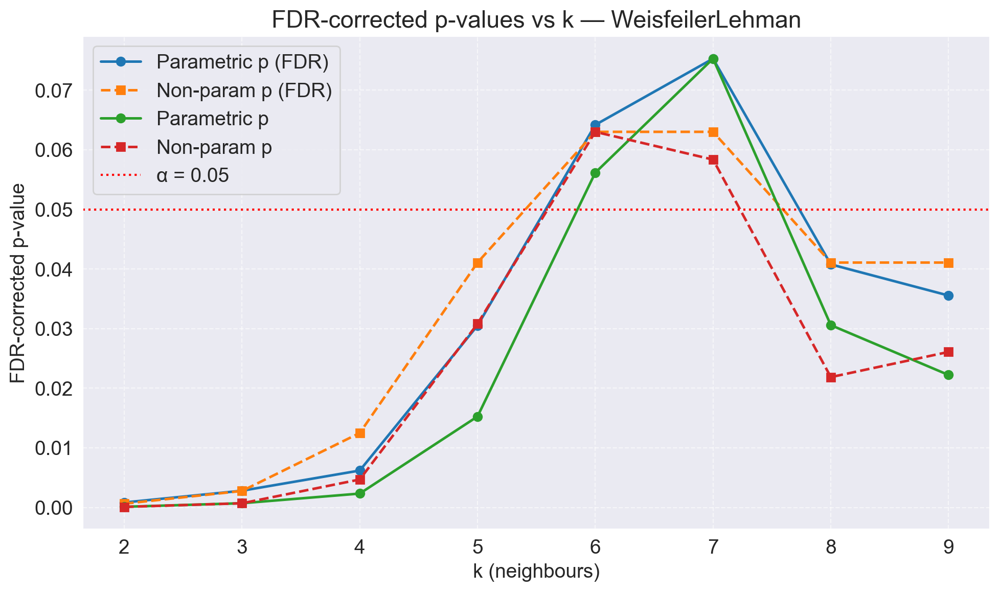

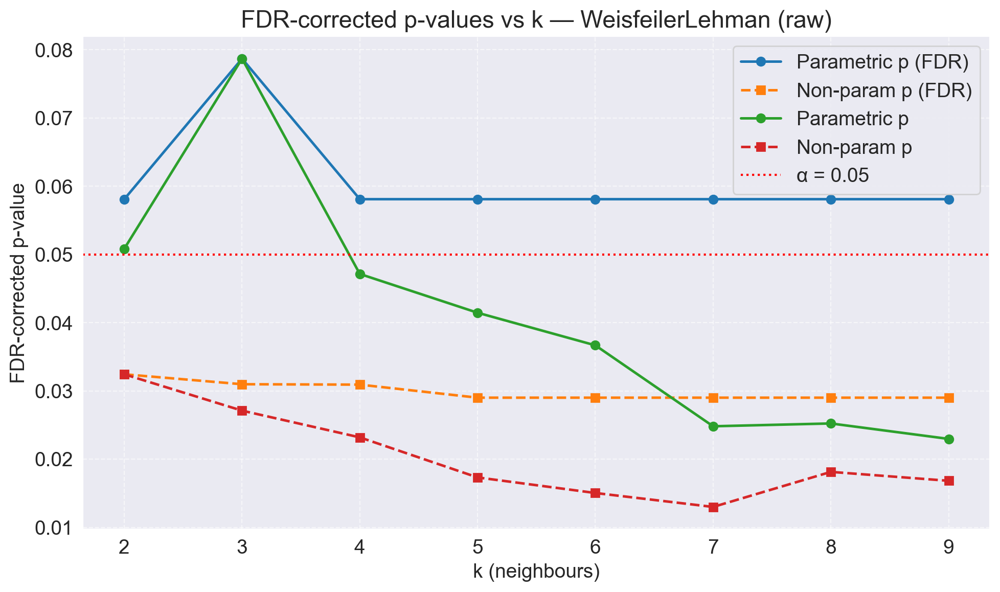

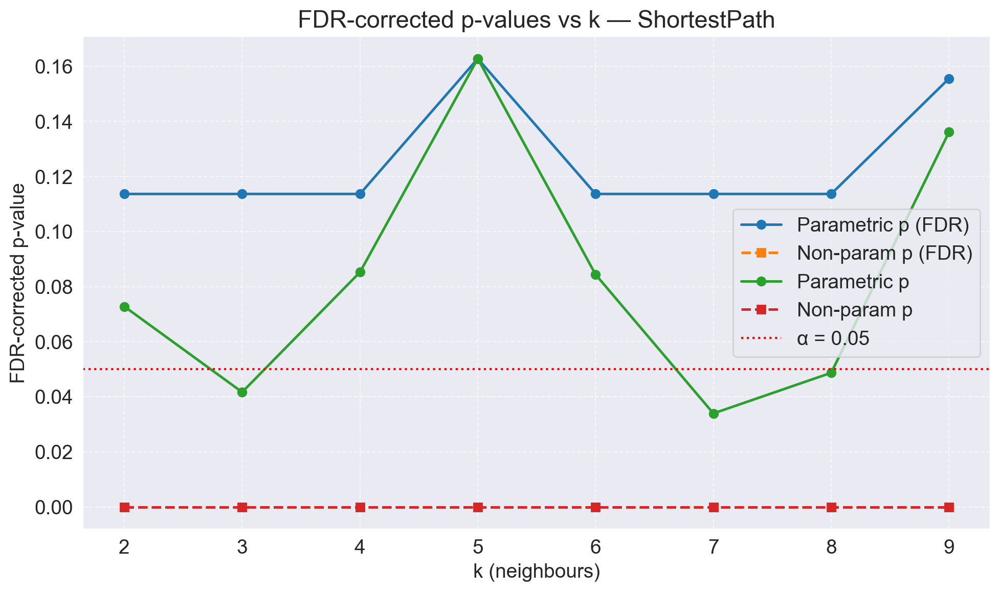

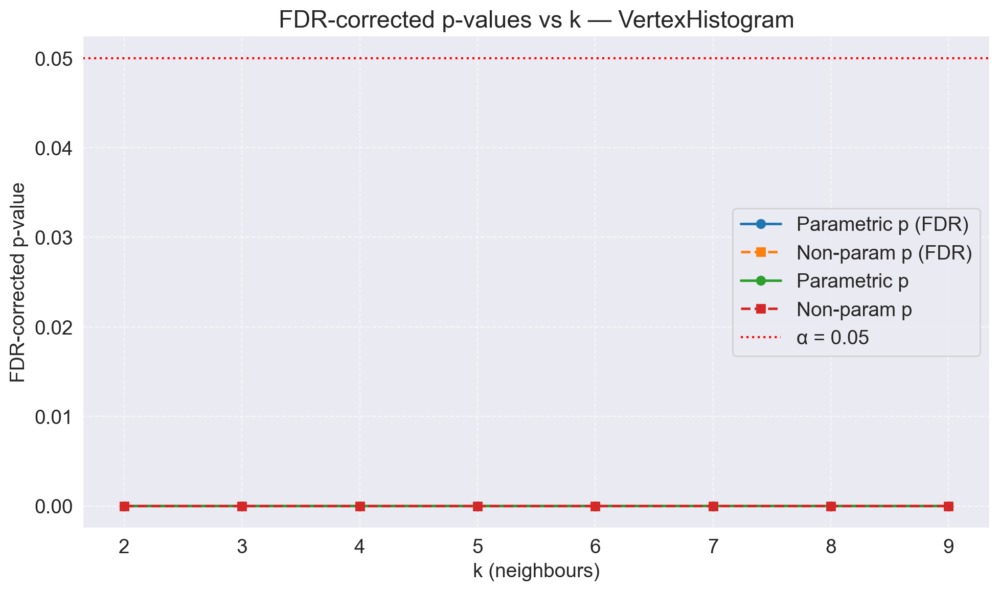

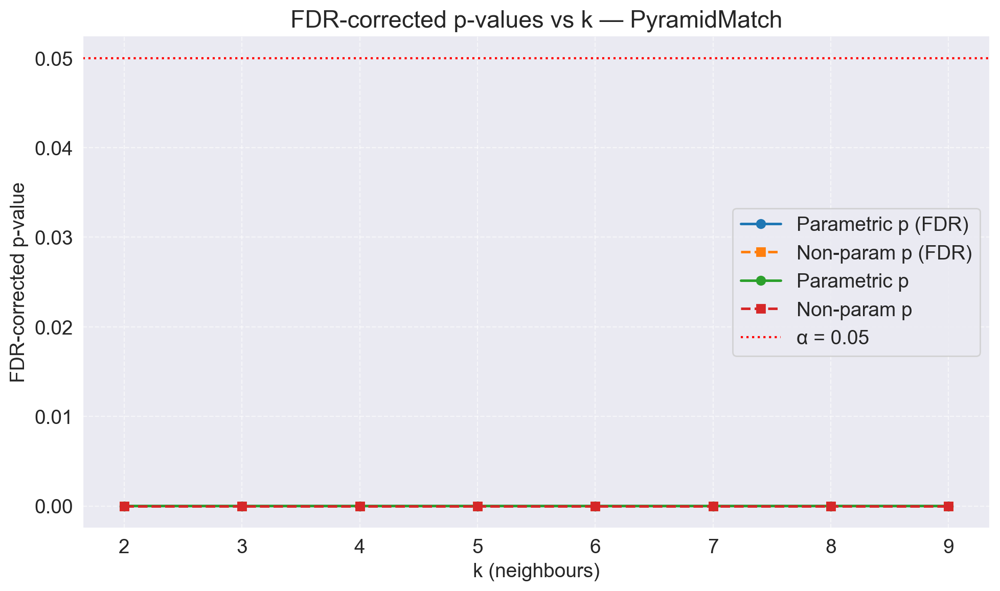

C:\.School\Thesisv3\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


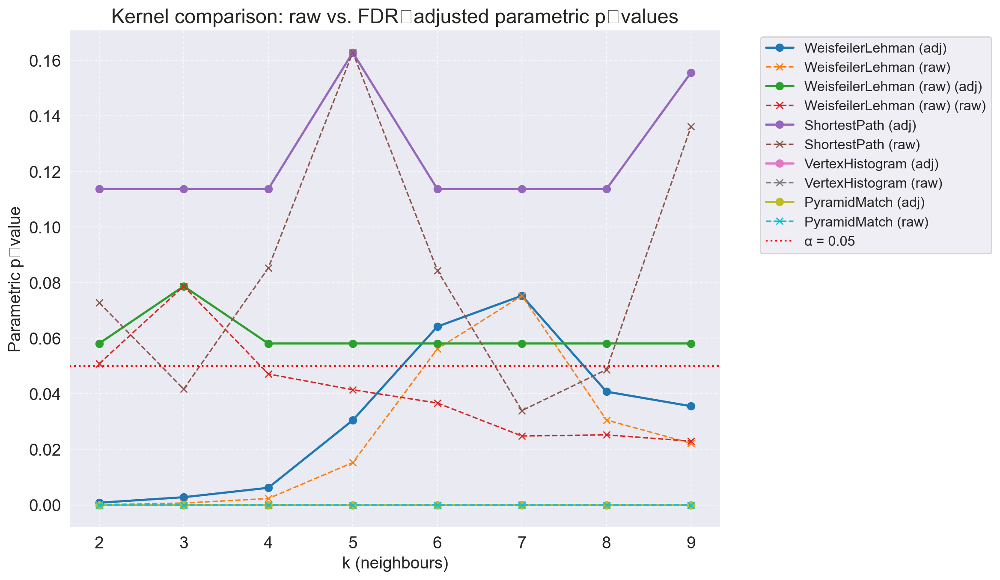

In [11]:
from thesisv3.validation.tuners import compare_kernels #ir_mode|ir_pattern_diversity
exp_ir = compare_kernels(batcher_dir="./conference-output/expectancy_v1", output_dir="./conference-output/expectancy_ir_v1/tuner", min_k=2, max_k=10, label='expectancy|ir_mode')

In [ ]:
exp_ir['WeisfeilerLehman']

___
# Tuner stats

In [12]:
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

def generate_visualizations(df, save_dir=None):
    """
    Generate p-value, distance, and effect size visualizations from a DataFrame.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame containing columns: 'k', 'parametric_p_adj', 'non_parametric_p_adj',
        'average_within', 'average_between', 'cohens_d', and 'auc'
    
    save_dir : str or None, default None
        If a directory path is provided, figures will be saved there as PNG files:
        - pvalues_vs_k.png
        - distances_vs_k.png
        - effect_sizes_vs_k.png
    
    Returns:
    --------
    list
        List of matplotlib Figure objects for the generated plots
    """
    # Prepare save directory
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
    
    print("Generating visualizations...")
    figs = []

    with tqdm(total=3, desc="Creating plots") as pbar:
        # Plot 1: P-values vs k
        fig1 = plt.figure(figsize=(10, 6))
        plt.plot(df['k'], df['parametric_p_adj'], 'o-', label='Parametric p (FDR)', lw=1.8)
        plt.plot(df['k'], df['non_parametric_p_adj'], 's--', label='Non-param p (FDR)', lw=1.8)
        plt.axhline(0.05, ls=':', color='red', label='α = 0.05')
        plt.yscale('log')
        plt.xlabel('k (neighbours)')
        plt.ylabel('FDR-corrected p-value (log scale)')
        plt.title('FDR-corrected p-values vs k')
        plt.grid(ls='--', alpha=0.6)
        plt.legend()
        plt.tight_layout()
        figs.append(fig1)
        if save_dir:
            fig1.savefig(os.path.join(save_dir, 'pvalues_vs_k_normalized_kernel_logged.png'))
        pbar.update(1)
        
        # Plot 2: Within vs Between distances
        fig2 = plt.figure(figsize=(10, 6))
        plt.plot(df['k'], df['average_within'], 'o-', label='Intra-graph similarity', lw=1.8)
        plt.plot(df['k'], df['average_between'], 's--', label='Inter-graph similarity', lw=1.8)
        plt.xlabel('k (neighbours)')
        plt.ylabel('Average WL similarity')
        plt.title('Intra-graph vs inter-graph similarity measures')
        plt.grid(ls='--', alpha=0.6)
        plt.legend()
        plt.tight_layout()
        figs.append(fig2)
        if save_dir:
            fig2.savefig(os.path.join(save_dir, 'distances_vs_k.png'))
        pbar.update(1)
        
        # Plot 3: Effect size metrics
        fig3 = plt.figure(figsize=(10, 6))
        plt.plot(df['k'], df['cohens_d'], 'o-', label="Cohen's d", lw=1.8)
        plt.plot(df['k'], df['auc'], 's--', label='AUC', lw=1.8)
        plt.xlabel('k (neighbours)')
        plt.ylabel('Effect size')
        plt.title('Effect size metrics vs k')
        plt.grid(ls='--', alpha=0.6)
        plt.legend()
        plt.tight_layout()
        figs.append(fig3)
        if save_dir:
            fig3.savefig(os.path.join(save_dir, 'effect_sizes_vs_k.png'))
        pbar.update(1)
    
    return figs


In [ ]:
generate_visualizations(exp_ir['WeisfeilerLehman'], save_dir="./conference-output/figures")

In [ ]:
from thesisv3.analysis.visualization import visualize_mds, visualize_mds_interactive

In [13]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import seaborn as sns
import numpy as np
from sklearn.manifold import MDS

In [14]:
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42, normalized_stress=False)

In [15]:
high_similarity = [
    {'compositions': ['Bach | Cello Suite No. 3 in C Major', 'Bach | Cello Suite No. 6 in D Major'], 'similarity': 0.9302},
    {'compositions': ['Bach | Cello Suite No. 1 in G Major', 'Bach | Cello Suite No. 3 in C Major'], 'similarity': 0.9292},
    {'compositions': ['Bach | Cello Suite No. 2 in D Minor', 'Bach | Cello Suite No. 3 in C Major'], 'similarity': 0.9282},
    # {'compositions': ['Bach | Cello Suite No. 2 in D Minor', 'Bach | Cello Suite No. 6 in D Major'], 'similarity': 0.9269},
    # {'compositions': ['Bach | Cello Suite No. 4 in E-flat Major', 'Bach | Cello Suite No. 6 in D Major'], 'similarity': 0.9171},
    {'compositions': ["Chopin | Étude Op. 10 No. 7 'Toccata'", "Chopin | Étude Op. 25 No. 11 'Winter Wind'"], 'similarity': 0.9126},
    # {'compositions': ['Bach | Cello Suite No. 3 in C Major', 'Bach | Cello Suite No. 4 in E-flat Major'], 'similarity': 0.9063},
    # {'compositions': ['Bach | Cello Suite No. 1 in G Major', 'Bach | Cello Suite No. 2 in D Minor'], 'similarity': 0.8971},
    # {'compositions': ['Bach | Cello Suite No. 2 in D Minor', 'Bach | Cello Suite No. 4 in E-flat Major'], 'similarity': 0.8968},
    # {'compositions': ['Bach | Cello Suite No. 1 in G Major', 'Bach | Cello Suite No. 6 in D Major'], 'similarity': 0.8913}
]

low_similarity = [
    # {'compositions': ["Chopin | Étude Op. 10 No. 7 'Toccata'", "Chopin | Étude Op. 25 No. 2 'The Bees'"], 'similarity': 0.0000},
    {'compositions': ['Chopin | Étude Op. 10 No. 10', "Chopin | Étude Op. 25 No. 2 'The Bees'"], 'similarity': 0.0015},
    # {'compositions': ["Chopin | Étude Op. 25 No. 11 'Winter Wind'", "Chopin | Étude Op. 25 No. 2 'The Bees'"], 'similarity': 0.0053},
    # {'compositions': ['Chopin | Waltz Op. 34 No. 3 in F Major', "Chopin | Étude Op. 10 No. 7 'Toccata'"], 'similarity': 0.0057},
    {'compositions': ['Chopin | Waltz Op. 34 No. 2 in A Minor', 'Chopin | Étude Op. 10 No. 10'], 'similarity': 0.0096},
    # {'compositions': ['Chopin | Waltz Op. 34 No. 2 in A Minor', "Chopin | Étude Op. 10 No. 7 'Toccata'"], 'similarity': 0.0124},
    {'compositions': ["Chopin | Étude Op. 25 No. 2 'The Bees'", "Chopin | Étude Op. 25 No. 9 'Butterfly'"], 'similarity': 0.0142},
    # {'compositions': ['Chopin | Waltz Op. 34 No. 3 in F Major', 'Chopin | Étude Op. 10 No. 10'], 'similarity': 0.0147},
    {'compositions': ["Chopin | Étude Op. 10 No. 2 'Chromatic'", "Chopin | Étude Op. 10 No. 7 'Toccata'"], 'similarity': 0.0159},
    # {'compositions': ['Chopin | Étude Op. 10 No. 10', "Chopin | Étude Op. 10 No. 2 'Chromatic'"], 'similarity': 0.0197}
]

median_similarity = [
    {'compositions': ['Bach | Cello Suite No. 1 in G Major', 'Chopin | Waltz Op. 34 No. 1 in A-flat Major'], 'similarity': 0.5483, 'distance': 0.0009},
    # {'compositions': ['Chopin | Waltz Op. 34 No. 3 in F Major', 'Ysaÿe | Violin Sonata No. 5 in G Major'], 'similarity': 0.5465, 'distance': 0.0009},
    # {'compositions': ['Chopin | Waltz Op. 42 in A Major', 'Chopin | Waltz Op. 64 No. 3 in A-flat Major'], 'similarity': 0.5465, 'distance': 0.0009},
    # {'compositions': ['Bach | Cello Suite No. 6 in D Major', 'Chopin | Waltz Op. 34 No. 2 in A Minor'], 'similarity': 0.5485, 'distance': 0.0010},
    {'compositions': ['Bach | Cello Suite No. 2 in D Minor', 'Chopin | Waltz Op. 42 in A Major'], 'similarity': 0.5490, 'distance': 0.0015},
    {'compositions': ['Bach | Cello Suite No. 4 in E-flat Major', 'Chopin | Étude Op. 10 No. 9'], 'similarity': 0.5490, 'distance': 0.0016},
    # {'compositions': ['Bach | Cello Suite No. 2 in D Minor', 'Chopin | Waltz Op. 34 No. 2 in A Minor'], 'similarity': 0.5458, 'distance': 0.0016},
    # {'compositions': ['Bach | Cello Suite No. 6 in D Major', 'Chopin | Waltz Op. 34 No. 1 in A-flat Major'], 'similarity': 0.5492, 'distance': 0.0018},
    {'compositions': ["Chopin | Waltz Op. 64 No. 1 'Minute Waltz'", "Chopin | Étude Op. 25 No. 12 'Ocean'"], 'similarity': 0.5456, 'distance': 0.0019},
    # {'compositions': ['Chopin | Waltz Op. 42 in A Major', "Chopin | Étude Op. 10 No. 4 'Torrent'"], 'similarity': 0.5454, 'distance': 0.0020}
]

In [16]:
segment_dict = expectancy_ir.segment_dict
graph_dict = expectancy_ir.graph_dict

In [ ]:
segment_dict[list(segment_dict.keys())[0]]

In [ ]:
pair_dict = {key: segment_dict[key] for key in ['Chopin | Waltz Op. 34 No. 2 in A Minor', 'Chopin | Étude Op. 10 No. 10']}

graph_pair_dict = {key: graph_dict[key] for key in ['Chopin | Waltz Op. 34 No. 2 in A Minor', 'Chopin | Étude Op. 10 No. 10']}

In [ ]:
concatenate_segments(pair_dict, graph_dict=graph_pair_dict)

In [ ]:


def calculate_separation_metrics(coordinates, metadata, piece_column='piece_name'):
    """
    Calculate silhouette score and classification accuracy for MDS projections
    of musical segments from two compositions.
    
    Parameters:
    -----------
    coordinates : ndarray
        The 2D coordinates from MDS
        
    metadata : list of dict
        List of dictionaries containing metadata for each segment
        
    piece_column : str
        The key in each metadata dictionary that contains the piece label
        
    Returns:
    --------
    dict
        Dictionary containing silhouette score and classification accuracy
    """
    # Extract the piece labels from the list of dictionaries
    labels = np.array([seg_metadata[piece_column] for seg_metadata in metadata])
    unique_labels = np.unique(labels)
    
    # We need exactly two pieces for this analysis
    if len(unique_labels) != 2:
        return {
            "silhouette_score": None,
            "classification_accuracy": None,
            "error": "This function requires exactly 2 pieces for comparison"
        }
    
    # Convert labels to numeric form (0 and 1) for the metrics
    numeric_labels = np.zeros(len(labels))
    mask_second_piece = labels == unique_labels[1]
    numeric_labels[mask_second_piece] = 1
    
    # Get points for each piece
    points_piece1 = coordinates[~mask_second_piece]
    points_piece2 = coordinates[mask_second_piece]
    
    # Check if we have enough points
    if len(points_piece1) < 3 or len(points_piece2) < 3:
        return {
            "silhouette_score": None,
            "classification_accuracy": None,
            "error": "Each piece needs at least 3 points for reliable metrics"
        }
    
    results = {}
    
    # 1. Silhouette Score: Higher values (closer to 1) indicate better separation
    try:
        results["silhouette_score"] = silhouette_score(coordinates, numeric_labels)
    except Exception as e:
        results["silhouette_score"] = None
        results["silhouette_error"] = str(e)
    
    # 2. Classification Accuracy: Higher accuracy means better separability
    try:
        # Use KNN classifier with leave-one-out cross-validation for robust assessment
        knn = KNeighborsClassifier(n_neighbors=min(5, min(len(points_piece1), len(points_piece2))))
        cv = LeaveOneOut()
        scores = cross_val_score(knn, coordinates, numeric_labels, cv=cv)
        results["classification_accuracy"] = np.mean(scores)
    except Exception as e:
        results["classification_accuracy"] = None
        results["classification_error"] = str(e)
    
    return results

def create_global_piece_color_map(similarity_pairs):
    """
    Create a global color mapping for all unique pieces across all plots.
    
    Parameters:
    -----------
    similarity_pairs : list of dict
        List of dictionaries where each dict has:
        - 'compositions': list of two composition names
        - 'similarity': float representing similarity score
        
    Returns:
    --------
    dict
        Mapping from piece name to color
    """
    # Extract all unique piece names
    all_pieces = set()
    for pair in similarity_pairs:
        for comp in pair["compositions"]:
            # Extract just the piece name without composer
            piece_name = comp.split('|')[1].strip() if '|' in comp else comp
            all_pieces.add(piece_name)
    
    # Create a color map using a colormap with distinct colors
    # Using the recommended approach instead of deprecated get_cmap
    import matplotlib.pyplot as plt
    cmap = plt.colormaps['tab20']
    return {piece: cmap(i % 20) for i, piece in enumerate(sorted(all_pieces))}

def visualize_mds_on_ax(ax, coordinates, metadata, piece_color_map, piece_column='piece_name', 
                    similarity=None, silhouette=None, classification_acc=None, 
                    composer1="", piece1="", composer2="", piece2=""):
    """
    Visualize MDS projection on a given axis with consistent colors for pieces.
    
    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The axis to plot on
        
    coordinates : ndarray
        The 2D coordinates from MDS
        
    metadata : list of dict
        List of dictionaries containing metadata for each segment
        
    piece_color_map : dict
        Global mapping from piece name to color
        
    piece_column : str
        The key in each metadata dictionary that contains the piece label
        
    similarity, silhouette, classification_acc : float, optional
        Metrics to display in the plot
        
    composer1, piece1, composer2, piece2 : str, optional
        Names of the compositions being compared
    """
    # Extract all pieces in this plot
    piece_labels = [meta[piece_column] for meta in metadata]
    unique_pieces = np.unique(piece_labels)
    
    # Plot each piece with its assigned color
    for piece in unique_pieces:
        # Get indices for this piece
        indices = [i for i, label in enumerate(piece_labels) if label == piece]
        
        # Extract just the piece name without composer for color mapping
        piece_name = piece.split('|')[1].strip() if '|' in piece else piece
        
        # Get the color from our global mapping
        color = piece_color_map.get(piece_name)
        
        # Plot the points
        ax.scatter(
            coordinates[indices, 0],
            coordinates[indices, 1],
            c=[color],
            label=piece_name,
            alpha=0.7
        )
    
    # Remove axes spines for cleaner look
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    # Remove ticks but keep faint grid for reference
    ax.tick_params(axis='both', which='both', length=0)
    ax.grid(True, linestyle='--', alpha=0.3)
    
    # Add comparison text and metrics directly in the plot
    metrics_text = ""
    
    # Create legend-like display for metrics
    if any(m is not None for m in [similarity, silhouette, classification_acc]):
        # Create empty handles with metric values as labels
        from matplotlib.lines import Line2D
        handles = []
        labels = []
        
        if similarity is not None:
            handles.append(Line2D([], [], linestyle='None'))
            labels.append(f"Weisfeiler-Lehman Similarity: {similarity:.4f}")
        
        if silhouette is not None:
            handles.append(Line2D([], [], linestyle='None'))
            labels.append(f"Silhouette: {silhouette:.3f}")
        
        if classification_acc is not None:
            handles.append(Line2D([], [], linestyle='None'))
            labels.append(f"Classification Acc: {classification_acc:.3f}")
        
        # Add a legend with metrics
        metrics_legend = ax.legend(
            handles=handles,
            labels=labels,
            loc='best',
            handlelength=0,
            handletextpad=0,
            fontsize=9,
            framealpha=0.8,
            facecolor='white',
            edgecolor='lightgray',
            title_fontsize=9,
            # bbox_to_anchor=(0.05, 0.95)
        )
        
        # Ensure the metrics legend doesn't get removed when other legends are added
        ax.add_artist(metrics_legend)

def visualize_music_similarity_pairs(similarity_pairs, segment_dict, n_rows=2, n_cols=2, 
                                    figsize=(14, 11), title="Pairwise Music Segment MDS Comparisons"):
    """
    Visualize multiple music composition pairs using MDS projections with separation metrics
    and consistent coloring across plots with a legend at the top.
    
    Parameters:
    -----------
    similarity_pairs : list of dict
        List of dictionaries where each dict has:
        - 'compositions': list of two composition names
        - 'similarity': float representing similarity score
    
    segment_dict : dict
        Dictionary mapping composition names to their segment data
        
    n_rows, n_cols : int
        Number of rows and columns for the subplot grid
        
    figsize : tuple
        Figure size (width, height) in inches
        
    title : str
        Overall figure title
        
    Returns:
    --------
    fig, axes, metrics_summary : tuple
        matplotlib figure, axes objects, and metrics summary
    """
    # Create MDS object
    from sklearn.manifold import MDS
    mds = MDS(n_components=2, random_state=42, dissimilarity='precomputed')
    
    # Create global color mapping for consistent colors across plots
    piece_color_map = create_global_piece_color_map(similarity_pairs)
    
    # Create figure with gridspec to accommodate the legend at the top
    fig = plt.figure(figsize=figsize)
    # Reserve space at the top for the title and legend (15% of height)
    gs = fig.add_gridspec(nrows=n_rows+1, ncols=n_cols, height_ratios=[0.15] + [1]*n_rows)
    
    # Create subplots in the main area
    axes = []
    for row in range(1, n_rows+1):  # Skip the first row (reserved for legend)
        for col in range(n_cols):
            ax = fig.add_subplot(gs[row, col])
            axes.append(ax)
    
    # Track metrics for averaging
    silhouette_scores = []
    classification_accuracies = []
    
    # Track all pieces that appear in plots for the global legend
    all_pieces_in_plots = set()
    
    # Process each pair and plot
    for i, pair_data in enumerate(similarity_pairs):
        if i >= len(axes):  # Skip if we've used all available subplots
            print(f"Warning: More pairs ({len(similarity_pairs)}) than available subplots ({len(axes)}). Skipping remaining pairs.")
            break
            
        ax = axes[i]  # Get current subplot
        compositions = pair_data["compositions"]
        similarity = pair_data["similarity"]
        
        try:
            # Check if data exists in segment_dict
            if not all(comp in segment_dict for comp in compositions):
                missing = [comp for comp in compositions if comp not in segment_dict]
                print(f"  Skipping pair {i+1}: Missing data for: {', '.join(missing)}")
                ax.text(0.5, 0.5, "Data Unavailable", horizontalalignment='center', 
                       verticalalignment='center', transform=ax.transAxes)
                continue
                
            # Get data for the pair
            pair_dict = {key: segment_dict[key] for key in compositions}
            pair_segments, pair_metadata, pair_d = concatenate_segments(pair_dict)
            
            # Check if enough data points for MDS
            if pair_d.shape[0] < 4:  # Need at least 2 points per piece
                print(f"  Skipping pair {i+1}: Not enough segments ({pair_d.shape[0]}) for MDS.")
                ax.text(0.5, 0.5, "Insufficient Segments", horizontalalignment='center', 
                       verticalalignment='center', transform=ax.transAxes)
                continue
                
            # Compute MDS coordinates
            pair_coordinates = mds.fit_transform(pair_d)
            
            # Extract composer and piece names
            composer1, piece1 = compositions[0].split('|') if '|' in compositions[0] else ("", compositions[0])
            composer2, piece2 = compositions[1].split('|') if '|' in compositions[1] else ("", compositions[1])
            
            # Add pieces to the global legend set
            piece1_name = piece1.strip()
            piece2_name = piece2.strip()
            all_pieces_in_plots.add(piece1_name)
            all_pieces_in_plots.add(piece2_name)
            
            # Calculate metrics
            metrics = calculate_separation_metrics(pair_coordinates, pair_metadata)
            
            # Extract metrics values
            silhouette = metrics.get("silhouette_score")
            classification_acc = metrics.get("classification_accuracy")
            
            # Store valid metrics for averaging
            if silhouette is not None:
                silhouette_scores.append(silhouette)
            
            if classification_acc is not None:
                classification_accuracies.append(classification_acc)
            
            # Visualize on the current subplot with consistent coloring and metrics inside the plot
            visualize_mds_on_ax(
                ax, 
                pair_coordinates, 
                pair_metadata, 
                piece_color_map,
                similarity=similarity,
                silhouette=silhouette,
                classification_acc=classification_acc,
                composer1=composer1.strip(),
                piece1=piece1.strip(),
                composer2=composer2.strip(),
                piece2=piece2.strip()
            )
            
        except Exception as e:
            print(f"  Error processing pair {i+1}: {e}")
            ax.text(0.5, 0.5, f"Error: {str(e)[:50]}...", horizontalalignment='center', 
                   verticalalignment='center', transform=ax.transAxes)
    
    # Create legend handles for all pieces that appeared in the plots
    legend_handles = []
    for piece_name in sorted(all_pieces_in_plots):
        color = piece_color_map.get(piece_name)
        if color:
            legend_handles.append(Patch(facecolor=color, alpha=0.7, label=piece_name))
    
    # Create a special axis for the title and legend in the top row
    title_ax = fig.add_subplot(gs[0, :])
    title_ax.axis('off')  # Turn off axis
    
    # Add the main title at the top center
    title_ax.text(0.5, 0.8, title, fontsize=16, horizontalalignment='center', verticalalignment='top')# fontweight='bold'
    
    # Add the legend below the title
    if legend_handles:
        title_ax.legend(
            handles=legend_handles,
            loc='center',
            fontsize='small',
            ncol=min(5, len(legend_handles)),  # Multiple columns if many items
            frameon=True,
            bbox_to_anchor=(0.5, 0.1)  # Position below the title
        )
    
    # Add average metrics text at the bottom
    avg_silhouette = np.mean(silhouette_scores) if silhouette_scores else None
    avg_accuracy = np.mean(classification_accuracies) if classification_accuracies else None
    
    if avg_silhouette is not None or avg_accuracy is not None:
        avg_text = "Average Metrics:"
        if avg_silhouette is not None:
            avg_text += f" Silhouette: {avg_silhouette:.3f}"
        if avg_accuracy is not None:
            avg_text += f" | Classification Acc: {avg_accuracy:.3f}"
            
        fig.text(
            0.5, 0.01,
            avg_text,
            horizontalalignment='center',
            fontsize=11,
            bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9)
        )
    
    # Adjust layout
    fig.tight_layout(rect=[0, 0.03, 1, 0.97])
    
    # Hide any unused subplots
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)
    
    # Create metrics summary
    metrics_summary = {
        "average_silhouette": avg_silhouette,
        "average_classification_accuracy": avg_accuracy,
        "individual_silhouette_scores": silhouette_scores,
        "individual_classification_accuracies": classification_accuracies
    }
    
    return fig, axes, metrics_summary

In [ ]:
fig, axes, summary = visualize_music_similarity_pairs(low_similarity, segment_dict, title='Pairwise MDS Comparisons for Low Similarity Graphs')
plt.show()

In [ ]:
fig2, axes2, summary2 = visualize_music_similarity_pairs(median_similarity, segment_dict, title='Pairwise MDS Comparisons for Moderate Similarity Graphs')
plt.show()

In [ ]:
fig3, axes3, summary3 = visualize_music_similarity_pairs(high_similarity, segment_dict, title='Pairwise MDS Comparisons for High Similarity Graphs')
plt.show()

In [ ]:
similarity_matrix = pd.read_csv("sim_mat.csv", index_col="Piece_1")

In [ ]:
similarity_matrix

In [ ]:
import numpy as np
from sklearn.metrics import silhouette_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut, cross_val_score
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import itertools

# Optional: Use seaborn for better aesthetics
try:
    import seaborn as sns
    sns.set_theme(style="darkgrid") # Or "whitegrid", "dark", "ticks"
    # Use a seaborn color palette if available, otherwise fallback
    COLOR_PALETTE = sns.color_palette("husl", 20) # Example: husl is good for many distinct colors
except ImportError:
    # Fallback to matplotlib's tab20 if seaborn is not installed
    COLOR_PALETTE = plt.colormaps['tab20'].colors



def calculate_separation_metrics(coordinates, metadata, piece_column='piece_name'):
    """
    Calculate silhouette score and classification accuracy for MDS projections
    of musical segments from two compositions. (Modified for clarity)

    Parameters:
    -----------
    coordinates : ndarray (n_samples, n_dimensions)
        The coordinates from MDS (usually 2D).
    metadata : list of dict
        List of dictionaries containing metadata for each segment.
    piece_column : str
        The key in each metadata dictionary that contains the piece label.

    Returns:
    --------
    dict
        Dictionary containing 'silhouette_score' and 'classification_accuracy'.
        Returns None for a metric if calculation fails or is not applicable.
    """
    labels = np.array([md[piece_column] for md in metadata])
    unique_labels = np.unique(labels)

    results = {
        "silhouette_score": None,
        "classification_accuracy": None,
        "error": None
    }

    if len(unique_labels) != 2:
        results["error"] = "Requires exactly 2 pieces for comparison."
        return results

    if coordinates is None or len(coordinates) < 3:
         results["error"] = "Requires at least 3 data points."
         return results

    # Convert labels to numeric (0 and 1)
    numeric_labels = np.array([0 if label == unique_labels[0] else 1 for label in labels])

    # Count points per piece
    n_points_piece1 = np.sum(numeric_labels == 0)
    n_points_piece2 = np.sum(numeric_labels == 1)

    # Check for sufficient points per cluster for metrics
    min_points_needed = 2 # Silhouette needs at least 2 points total, KNN needs enough neighbors

    if n_points_piece1 < min_points_needed or n_points_piece2 < min_points_needed or len(numeric_labels) < 3:
         results["error"] = f"Insufficient points for metrics (Need >= {min_points_needed} per piece, >= 3 total)."
         # Still might be able to calculate one metric, attempt below

    # 1. Silhouette Score
    if len(np.unique(numeric_labels)) > 1 and coordinates.shape[0] > 1: # Need >1 cluster and >1 sample
        try:
            # Ensure coordinates are valid
            if np.any(np.isnan(coordinates)) or np.any(np.isinf(coordinates)):
                 raise ValueError("Coordinates contain NaN or Inf.")
            # Ensure there's variance in coordinates if required by silhouette
            if np.all(coordinates[0] == coordinates):
                 raise ValueError("All coordinate points are identical.")

            results["silhouette_score"] = silhouette_score(coordinates, numeric_labels)
        except ValueError as e:
            print(f"  - Silhouette calculation error: {e}")
            results["error"] = results.get("error", "") + f" Silhouette Error: {e}."
        except Exception as e:
            print(f"  - Unexpected Silhouette error: {e}")
            results["error"] = results.get("error", "") + f" Unexpected Silhouette Error: {e}."


    # 2. Classification Accuracy (KNN with Leave-One-Out)
    # KNN needs enough neighbors, min(n_neighbors) typically >= 1. LOOCV works even with small N.
    # Let's use min(3, n_points_in_smallest_class) neighbors.
    min_samples_in_class = min(n_points_piece1, n_points_piece2)
    if min_samples_in_class >= 1 and coordinates.shape[0] >= 2: # Need at least 1 sample per class and 2 total
        try:
             # Ensure coordinates are valid
            if np.any(np.isnan(coordinates)) or np.any(np.isinf(coordinates)):
                 raise ValueError("Coordinates contain NaN or Inf for KNN.")

            n_neighbors = min(3, min_samples_in_class) # Sensible default
            if n_neighbors < 1: # Should not happen if min_samples_in_class >= 1, but safety check
                raise ValueError("Not enough samples in the smallest class for KNN.")

            knn = KNeighborsClassifier(n_neighbors=n_neighbors)
            cv = LeaveOneOut()
            scores = cross_val_score(knn, coordinates, numeric_labels, cv=cv, error_score='raise')
            results["classification_accuracy"] = np.mean(scores)
        except ValueError as e:
            print(f"  - Classification accuracy calculation error: {e}")
            results["error"] = results.get("error", "") + f" Classification Error: {e}."
        except Exception as e:
             print(f"  - Unexpected Classification error: {e}")
             results["error"] = results.get("error", "") + f" Unexpected Classification Error: {e}."


    return results


def visualize_mds_on_ax(ax, coordinates, metadata, piece_to_color_map, title, piece_column='piece_name'):
    """
    Visualizes MDS coordinates on a given matplotlib Axes object with consistent colors.

    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The Axes object to plot on.
    coordinates : ndarray (n_samples, 2)
        The 2D coordinates from MDS.
    metadata : list of dict
        Metadata for each point, must contain piece_column.
    piece_to_color_map : dict
        Mapping from piece name (str) to color.
    title : str
        Title for the subplot.
    piece_column : str
        Key in metadata dicts to identify the piece.
    """
    if coordinates is None or len(coordinates) == 0:
        ax.text(0.5, 0.5, "No data to plot", ha='center', va='center', transform=ax.transAxes)
        ax.set_title(title, fontsize=10)
        return

    pieces_in_plot = sorted(list(set(md[piece_column] for md in metadata)))

    handles = []
    for piece_name in pieces_in_plot:
        # Find indices for the current piece
        indices = [i for i, md in enumerate(metadata) if md[piece_column] == piece_name]

        if not indices: continue # Skip if piece somehow has no points

        piece_coords = coordinates[indices, :]
        color = piece_to_color_map.get(piece_name, 'gray') # Use gray if piece somehow not in map

        # Use simpler piece name for legend if possible (e.g., remove composer)
        display_name = piece_name.split('|')[-1].strip()

        scatter = ax.scatter(piece_coords[:, 0], piece_coords[:, 1],
                             color=color, label=display_name,
                             alpha=0.7, s=50) # s is marker size
        handles.append(scatter)

    ax.set_title(title, fontsize=10, pad=15) # Add padding if title overlaps text
    ax.set_xlabel("Dimension 1")
    ax.set_ylabel("Dimension 2")
    ax.grid(True, linestyle='--', alpha=0.5)

    # Create legend
    # Shrink current axis's height slightly on bottom to make room for legend
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.12,
                     box.width, box.height * 0.88])

    # Put a legend below current axis
    ax.legend(handles=handles,
              loc='upper center', bbox_to_anchor=(0.5, -0.15), # Adjust y to move legend below axis
              fancybox=True, shadow=False, ncol=1, fontsize=8) # Adjust ncol based on number of pieces

def visualize_music_similarity_pairs_with_metrics(
    similarity_pairs,
    segment_dict,
    piece_column='piece_name', # Key in metadata for piece name
    n_rows=2, n_cols=2,
    figsize=(14, 11),
    title="Pairwise Music Segment MDS Comparisons"
    ):
    """
    Visualize multiple music composition pairs using MDS with consistent colors and metrics.

    Parameters:
    -----------
    similarity_pairs : list of dict
        Each dict: {'compositions': [name1, name2], 'similarity': score}
    segment_dict : dict
        Maps composition name (key in 'compositions') to segment data.
    piece_column : str
        Metadata key containing the piece name for coloring and metrics.
    n_rows, n_cols : int
        Grid dimensions for subplots.
    figsize : tuple
        Figure size.
    title : str
        Overall figure title.

    Returns:
    --------
    fig, axes, metrics_summary : tuple
        matplotlib figure, axes objects, and metrics summary dict.
    """
    mds = MDS(n_components=2, random_state=42, dissimilarity='precomputed', normalized_stress=False)

    # 1. Determine all unique pieces across all pairs involved
    all_pieces = set()
    valid_pairs_indices = [] # Keep track of pairs we can actually plot
    plotted_pairs_data = [] # Store data for pairs that will be plotted
    for i, pair_data in enumerate(similarity_pairs):
         # Basic check if pair data seems valid
         if 'compositions' in pair_data and len(pair_data['compositions']) == 2:
              comps = pair_data['compositions']
              # Check if data exists for *both* compositions
              if all(comp in segment_dict for comp in comps):
                   all_pieces.update(comps)
                   valid_pairs_indices.append(i)
                   plotted_pairs_data.append(pair_data)
              else:
                   missing = [c for c in comps if c not in segment_dict]
                   print(f"Info: Skipping pair {i+1} ({' vs '.join(comps)}): Missing data for {missing}")
         else:
              print(f"Warning: Skipping invalid pair data at index {i}: {pair_data}")

    if not valid_pairs_indices:
        print("Error: No valid pairs found with available data in segment_dict. Cannot generate plot.")
        # Return empty figure or handle as appropriate
        fig, ax = plt.subplots()
        ax.text(0.5, 0.5, "No valid data pairs to plot", ha='center', va='center')
        return fig, np.array([[ax]]), {} # Return empty figure/axes


    unique_pieces = sorted(list(all_pieces))
    print(f"Found {len(unique_pieces)} unique pieces across {len(valid_pairs_indices)} plottable pairs.")

    # 2. Create consistent color map
    num_colors_needed = len(unique_pieces)
    if num_colors_needed > len(COLOR_PALETTE):
        print(f"Warning: Need {num_colors_needed} colors, but palette only has {len(COLOR_PALETTE)}. Colors will repeat.")
        # Cycle through the palette
        colors = [COLOR_PALETTE[i % len(COLOR_PALETTE)] for i in range(num_colors_needed)]
    else:
        colors = COLOR_PALETTE[:num_colors_needed]

    piece_to_color_map = dict(zip(unique_pieces, colors))

    # Adjust grid size if needed, ensure enough subplots
    num_plots_needed = len(valid_pairs_indices)
    actual_n_rows, actual_n_cols = n_rows, n_cols
    while actual_n_rows * actual_n_cols < num_plots_needed:
        # Simple strategy: try adding a row, then a column
        if actual_n_rows <= actual_n_cols:
            actual_n_rows += 1
        else:
            actual_n_cols += 1
        print(f"Adjusting grid size to {actual_n_rows}x{actual_n_cols} to fit {num_plots_needed} plots.")


    # 3. Create subplots
    fig, axes = plt.subplots(actual_n_rows, actual_n_cols, figsize=figsize, squeeze=False) # squeeze=False ensures axes is always 2D array
    axes = axes.flatten() # Flatten for easy iteration

    # 4. Initialize lists for average metrics
    all_silhouette_scores = []
    all_classification_accuracies = []

    plot_index = 0 # Index for placing plots in the grid
    # 5. Loop through VALID pairs and plot
    for pair_idx in valid_pairs_indices:
        if plot_index >= len(axes):
            print(f"Warning: Ran out of subplot axes ({len(axes)} available). Stopping.")
            break # Should not happen with adjusted grid, but safety check

        ax = axes[plot_index]
        pair_data = similarity_pairs[pair_idx] # Get the original pair data using the valid index
        compositions = pair_data["compositions"]
        similarity = pair_data.get("similarity", None) # Handle if similarity is missing

        # Format short names for printing/title
        comp_short_names = [c.split('|')[-1].strip() for c in compositions]
        print(f"\nProcessing Plot {plot_index + 1}: {' vs '.join(comp_short_names)}")

        try:
            # Get data for the pair (we already checked existence)
            pair_dict = {key: segment_dict[key] for key in compositions}
            # --- Call your actual segment concatenation ---
            pair_segments, pair_metadata, pair_d = concatenate_segments(pair_dict)
            # ------------------------------------------

            # Basic validation of returned data
            if pair_metadata is None or pair_d is None:
                 raise ValueError("concatenate_segments returned None for metadata or distance matrix.")
            if not isinstance(pair_metadata, list):
                 raise TypeError("concatenate_segments metadata should be a list.")
            if not isinstance(pair_d, np.ndarray) or pair_d.ndim != 2 or pair_d.shape[0] != pair_d.shape[1]:
                raise ValueError(f"Distance matrix must be a square 2D numpy array, got shape {pair_d.shape if isinstance(pair_d, np.ndarray) else type(pair_d)}")
            if len(pair_metadata) != pair_d.shape[0]:
                 raise ValueError(f"Mismatch between metadata length ({len(pair_metadata)}) and distance matrix dimension ({pair_d.shape[0]})")


            # Check for sufficient data points for MDS and metrics
            n_points = pair_d.shape[0]
            if n_points < 3: # Need at least 3 points for meaningful MDS/metrics
                print(f"  Skipping: Insufficient segments ({n_points}) for MDS/metrics (need >= 3).")
                ax.text(0.5, 0.5, f"Insufficient Data\n({n_points} segments)", ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f"{' vs '.join(comp_short_names)}\n(Data Insufficient)", fontsize=9)
                plot_index += 1
                continue

             # Check for valid distance matrix (non-negative, symmetric)
            if np.any(pair_d < 0):
                 print("  Warning: Negative values found in distance matrix. Clamping to 0.")
                 pair_d[pair_d < 0] = 0
            if not np.allclose(pair_d, pair_d.T):
                print("  Warning: Distance matrix not symmetric. Using (D + D.T) / 2.")
                pair_d = (pair_d + pair_d.T) / 2

            # Compute MDS coordinates
            print(f"  Computing MDS on {n_points} points...")
            pair_coordinates = mds.fit_transform(pair_d)
            print(f"  MDS computation complete. Coordinate shape: {pair_coordinates.shape}")

            # Create title for the subplot
            sim_text = f"(Similarity: {similarity:.4f})" if similarity is not None else "(Similarity: N/A)"
            subtitle = f"{comp_short_names[0]}\nvs\n{comp_short_names[1]}\n{sim_text}"

            # Visualize on the current subplot using the helper
            visualize_mds_on_ax(ax, pair_coordinates, pair_metadata,
                                piece_to_color_map=piece_to_color_map,
                                title=subtitle,
                                piece_column=piece_column)

            # Calculate and store metrics
            print("  Calculating separation metrics...")
            metrics = calculate_separation_metrics(pair_coordinates, pair_metadata, piece_column=piece_column)
            print(f"  Metrics calculated: {metrics}")

            # Store valid metrics for averaging
            if metrics.get("silhouette_score") is not None:
                all_silhouette_scores.append(metrics["silhouette_score"])
            if metrics.get("classification_accuracy") is not None:
                all_classification_accuracies.append(metrics["classification_accuracy"])

            # Add individual metrics text to subplot
            metrics_text = []
            if metrics.get("silhouette_score") is not None:
                metrics_text.append(f"Silhouette: {metrics['silhouette_score']:.3f}")
            if metrics.get("classification_accuracy") is not None:
                metrics_text.append(f"Classif. Acc: {metrics['classification_accuracy']:.3f}")

            if metrics_text:
                # Place text in upper left, slightly offset from edge
                 ax.text(0.03, 0.97, "\n".join(metrics_text), # Use newline separation
                    transform=ax.transAxes,
                    fontsize=9,
                    verticalalignment='top',
                    horizontalalignment='left',
                    # Use a background box that blends reasonably
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.75, edgecolor='lightgray')
                )
            elif metrics.get("error"):
                 # Display error message if metrics failed
                 ax.text(0.03, 0.97, f"Metrics Error:\n{metrics['error'][:50]}...", # Truncate long errors
                    transform=ax.transAxes,
                    fontsize=8, color='red',
                    verticalalignment='top', horizontalalignment='left',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7, edgecolor='red'))


        except Exception as e:
            print(f"  ERROR processing plot {plot_index + 1}: {e}")
            import traceback
            traceback.print_exc() # Print full traceback for debugging
            ax.text(0.5, 0.5, f"Error during processing:\n{str(e)[:60]}...", ha='center', va='center', transform=ax.transAxes, color='red')
            ax.set_title(f"{' vs '.join(comp_short_names)}\n(Error)", fontsize=9)

        plot_index += 1 # Move to the next subplot position

    # 6. Post-loop processing
    fig.suptitle(title, fontsize=16, y=0.99) # Adjust y to prevent overlap

    # Adjust layout to prevent overlap - may need multiple calls or manual tuning
    fig.tight_layout(rect=[0, 0.05, 1, 0.96]) # Leave space at bottom for avg metrics and top for suptitle

    # Hide any unused subplots
    for j in range(plot_index, len(axes)):
        axes[j].set_visible(False)

    # 7. Calculate and display average metrics
    avg_silhouette = np.mean(all_silhouette_scores) if all_silhouette_scores else None
    avg_accuracy = np.mean(all_classification_accuracies) if all_classification_accuracies else None

    avg_metrics_text = []
    if avg_silhouette is not None:
        avg_metrics_text.append(f"Average Silhouette: {avg_silhouette:.3f}")
    if avg_accuracy is not None:
        avg_metrics_text.append(f"Average Classification Acc: {avg_accuracy:.3f}")

    if avg_metrics_text:
        full_avg_text = "Average Metrics Across Plots:\n" + "\n".join(avg_metrics_text)
        fig.text(0.5, 0.02, # Position near bottom center
                 full_avg_text,
                 ha='center', va='bottom',
                 fontsize=11,
                 bbox=dict(boxstyle='round,pad=0.5', facecolor='lightyellow', alpha=0.85, edgecolor='darkgray')
                 )

    # 8. Return results
    metrics_summary = {
        "average_silhouette": avg_silhouette,
        "average_classification_accuracy": avg_accuracy,
        "individual_silhouette_scores": all_silhouette_scores,
        "individual_classification_accuracies": all_classification_accuracies,
        "plotted_pairs_count": plot_index,
         "total_unique_pieces": len(unique_pieces)
    }

    return fig, axes[:plot_index], metrics_summary # Return only the used axes


In [ ]:


# Run the visualization function
fig, used_axes, metrics_summary = visualize_music_similarity_pairs_with_metrics(
    similarity_pairs=low_similarity,
    segment_dict=segment_dict,
    piece_column='piece_name', # Make sure this matches the key in your metadata
    n_rows=2, n_cols=2,
    figsize=(12, 10) # Adjusted figsize slightly
)

print("\n--- Metrics Summary ---")
import json
print(json.dumps(metrics_summary, indent=2))

plt.show()

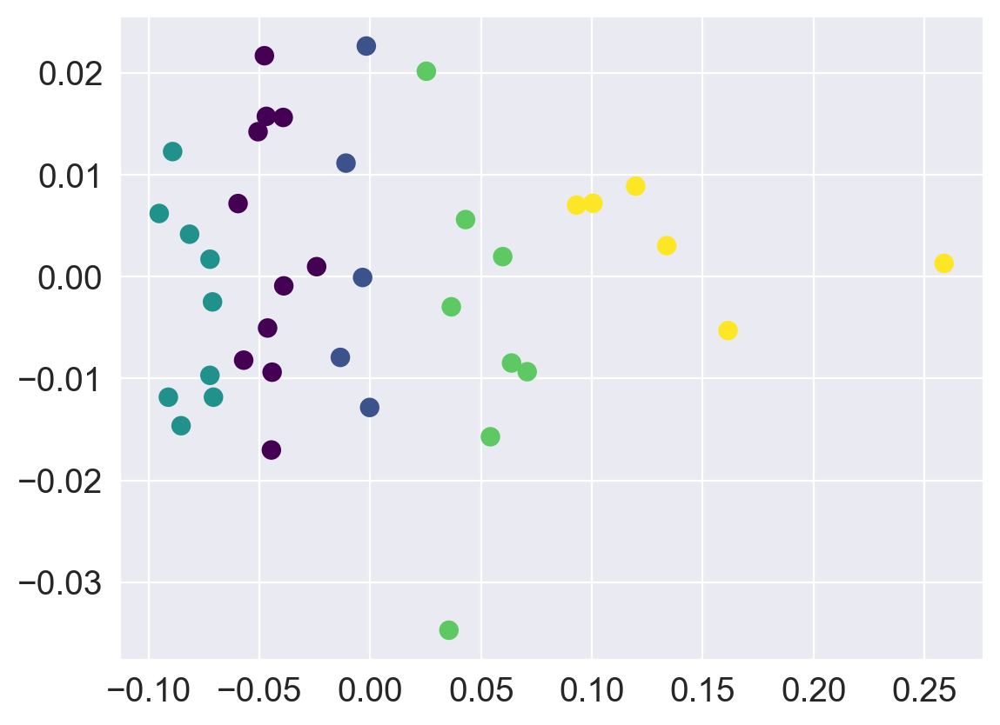

In [17]:
from thesisv3.validation.clustering import GraphKMeans
g_kmeans = GraphKMeans(expectancy_ir.processed_files, expectancy_ir.graphs, k=5)
# optimal_k_results = g_kmeans.find_optimal_k(k_range=range(2, 10))
g_kmeans.consensus_clustering(n_iterations=30)
metrics = g_kmeans.evaluate_clustering_quality()
clustered, labels = g_kmeans.get_labels()
# clustered
g_kmeans.visualize(display_file_name=False)
clustered.to_csv("./conference-output/figures/kmeans_cluster.csv", index=False)

In [18]:
g_kmeans.visualize_interactive(display_file_name=False)
